In [49]:
import pandas as pd
from datetime import datetime
import numpy as np
from tqdm import tqdm
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import Point
from shapely.ops import transform
from pyproj import Transformer
import ipyparallel as ipp
from scipy.stats import linregress
import seaborn as sns
from scipy.spatial.distance import cdist
from sklearn.linear_model import LinearRegression
import xml.etree.ElementTree as ET
import json
from pyproj import Transformer
from sklearn.decomposition import PCA
from joblib import Parallel, delayed, cpu_count
import pyproj
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.spatial import cKDTree
from shapely.geometry import LineString

In [2]:
s3_sar_5021 = "https://ds-h-ca-bigdata.s3.us-east-2.amazonaws.com/CA_DWR_VERT.csv"
sar_5021 = pd.read_csv(s3_sar_5021)

In [3]:
dry = ["2017", "2019", "2020", "2021"]
wet = ["2015", "2016", "2018", "2022", "2023"] # all in water year beginning Oct --> Sep

In [4]:
sar_5021.head()

,CODE,LAT,LON,HEIGHT,VEL_V,D20150101,D20150107,D20150113,D20150120,D20150126,...,D20240813,D20240820,D20240826,D20240901,D20240907,D20240913,D20240919,D20240925,D20241001,Basin_Subb
0,DX5IPRM,40.338973,-122.018572,320.85570,-1.6,NaN,NaN,NaN,NaN,NaN,...,-0.6,1.2,3.1,3.7,3.6,4.9,6.3,5.2,3.4,5-021.53
1,DX5IPRN,40.338973,-122.017438,673.82640,-0.6,NaN,NaN,NaN,NaN,NaN,...,-1.8,-1.5,-1.3,-1.2,-1.0,-0.3,-0.2,-0.2,-0.4,5-021.53
2,DX5IPRO,40.338973,-122.016305,10.95188,-0.3,NaN,NaN,NaN,NaN,NaN,...,1.2,1.2,1.5,2.0,2.1,2.5,2.5,2.6,2.0,5-021.53
3,DX5IPRP,40.338973,-122.015171,140.33210,-1.1,NaN,NaN,NaN,NaN,NaN,...,-0.0,0.3,1.0,1.8,2.1,2.8,3.0,2.9,2.1,5-021.53
4,DX5IPRQ,40.338973,-122.014037,25.95095,-0.1,NaN,NaN,NaN,NaN,NaN,...,3.3,3.7,4.5,5.3,5.3,5.6,5.6,5.4,4.5,5-021.53


In [5]:
def is_oct_2015_or_later(col_name):
    if col_name.startswith('D') and len(col_name) == 9:
        try:
            date_str = col_name[1:]
            date = datetime.strptime(date_str, '%Y%m%d')
            return date >= datetime(2015, 10, 1)
        except ValueError:
            return False
    return True

In [6]:
wy_2015_or_later = [col for col in sar_5021.columns if is_oct_2015_or_later(col)]

In [7]:
sar_5021_2015 = sar_5021[wy_2015_or_later].copy()

In [8]:
def extract_year_month(col_name):
    if col_name.startswith('D') and len(col_name) == 9:
        try:
            date_str = col_name[1:]
            date = datetime.strptime(date_str, '%Y%m%d')
            return date.year, date.month
        except ValueError:
            pass
    return None, None

year_month_columns = {}
for col in sar_5021_2015.columns:
    year, month = extract_year_month(col)
    if year is not None:
        year_month_columns.setdefault((year, month), []).append(col)

def calculate_average(row, columns):
    valid_values = [row[col] for col in columns if not pd.isna(row[col])]
    return np.mean(valid_values) if valid_values else np.nan

results = []
for index, row in tqdm(sar_5021_2015.iterrows(), total=len(sar_5021_2015), desc="Processing rows"):
    row_results = {'CODE': row['CODE']}
    for (year, month), columns in year_month_columns.items():
        if month == 10:
            oct_avg = calculate_average(row, columns)
            next_year_sep_columns = year_month_columns.get((year + 1, 9), [])
            sep_avg = calculate_average(row, next_year_sep_columns)
            if not np.isnan(oct_avg) and not np.isnan(sep_avg):
                row_results[f'Diff_{year}'] = oct_avg - sep_avg
    results.append(row_results)

wy_sar_5021 = pd.DataFrame(results)

Processing rows: 100%|██████████| 707344/707344 [04:56<00:00, 2387.12it/s]


In [9]:
def extract_year(col_name):
    if col_name.startswith('D') and len(col_name) == 9:
        return col_name.split("_")[1]
    return None

dry_columns = [col for col in wy_sar_5021.columns if extract_year(col) in dry]
wet_columns = [col for col in wy_sar_5021.columns if extract_year(col) in wet]

print("Dry Year Columns:", dry_columns)
print("Wet Year Columns:", wet_columns)

results = []
for idx, row in tqdm(wy_sar_5021.iterrows(), total=len(wy_sar_5021), desc="Processing rows"):
    well_code = row['CODE']
    dry_avg = row[dry_columns].mean()
    wet_avg = row[wet_columns].mean()
    results.append({
        'CODE': well_code,
        'Dry_Year_Avg': dry_avg,
        'Wet_Year_Avg': wet_avg
    })

wy_sar_5021_dry_wet = pd.DataFrame(results)

Dry Year Columns: ['Diff_2017', 'Diff_2020', 'Diff_2021', 'Diff_2019']
Wet Year Columns: ['Diff_2015', 'Diff_2016', 'Diff_2018', 'Diff_2022', 'Diff_2023']


Processing rows: 100%|██████████| 707344/707344 [05:26<00:00, 2166.98it/s]


In [5]:
SGMA = "../data/GWBasins.shp"
gdf = gpd.read_file(SGMA)
gdf.set_crs(epsg=3857, inplace=True)
gdf.set_index('OBJECTID', inplace=True)
gdf['Basin_Prefix'] = gdf['Basin_Numb'].str.split('-').str[0].astype(int)

In [11]:
wy_sar_5021_dry_wet.head()

,CODE,Dry_Year_Avg,Wet_Year_Avg
0,DX5IPRM,0.283333,2.226
1,DX5IPRN,-1.985000,3.196
2,DX5IPRO,-2.105000,2.860
3,DX5IPRP,-1.195000,3.244
4,DX5IPRQ,-2.605000,3.740


In [12]:
wy_sar_5021_dry_wet = pd.merge(wy_sar_5021_dry_wet, sar_5021[["CODE", "LAT", "LON"]], on="CODE", how='left')

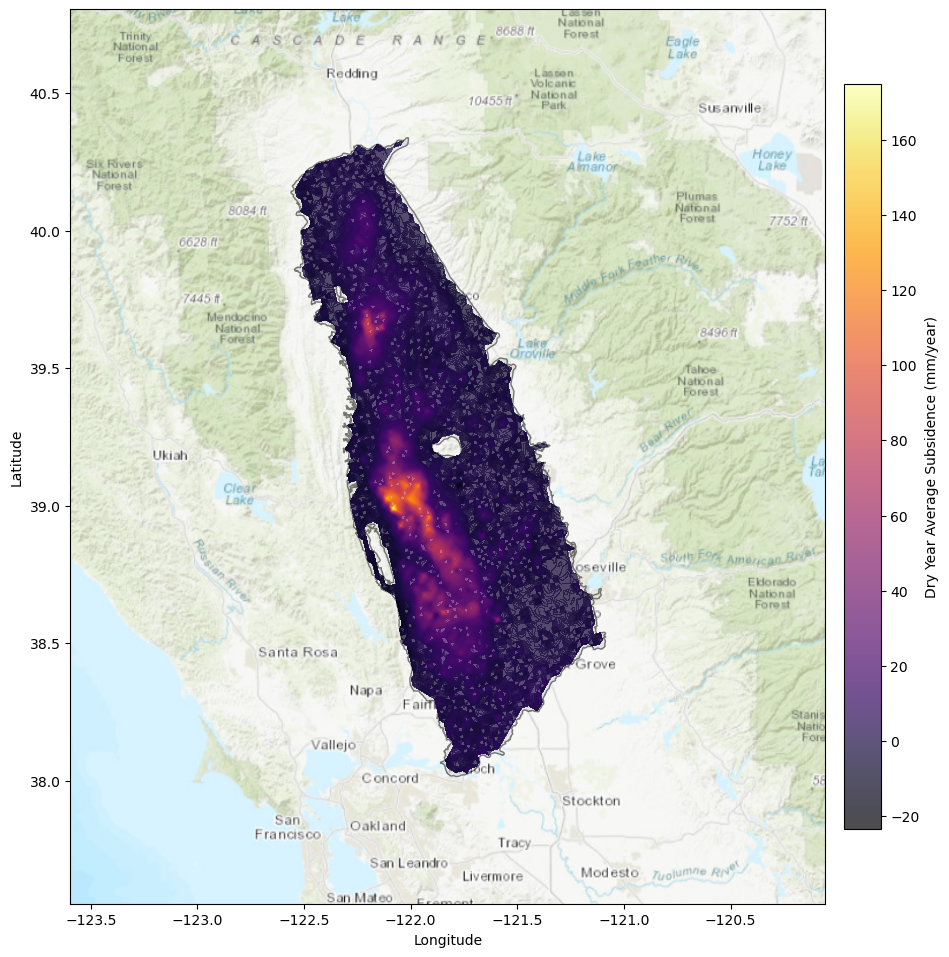

In [44]:
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']

larger_polygon = filtered_gdf.dissolve().geometry.iloc[0]
larger_polygon_gdf = gpd.GeoDataFrame(geometry=[larger_polygon], crs=filtered_gdf.crs)
larger_polygon_gdf = larger_polygon_gdf.to_crs(epsg=32633)
bounds = larger_polygon_gdf.total_bounds

wells_gdf = gpd.GeoDataFrame(
    wy_sar_5021_dry_wet,
    geometry=gpd.points_from_xy(wy_sar_5021_dry_wet['LON'], wy_sar_5021_dry_wet['LAT']),
    crs="EPSG:4326"
)
wells_gdf = wells_gdf.to_crs(larger_polygon_gdf.crs)

x = wells_gdf.geometry.x.values
y = wells_gdf.geometry.y.values
z = wells_gdf['Dry_Year_Avg'].values

grid_x = np.linspace(bounds[0], bounds[2], num=100)
grid_y = np.linspace(bounds[1], bounds[3], num=100)
xx, yy = np.meshgrid(grid_x, grid_y)

def idw_interpolation(x, y, z, grid_x, grid_y, power=2):
    grid_z = np.empty((len(grid_y), len(grid_x)))
    k = 100
    for i, xi in enumerate(grid_x):
        for j, yi in enumerate(grid_y):
            d = np.sqrt((x - xi)**2 + (y - yi)**2)
            valid = ~np.isnan(z)
            if not np.any(valid):
                grid_z[j, i] = np.nan
                continue

            d_valid = d[valid]
            z_valid = z[valid]

            k_actual = min(k, len(d_valid))
            idx_sorted = np.argsort(d_valid)[:k_actual]
            d_nearest = d_valid[idx_sorted]
            z_nearest = z_valid[idx_sorted]

            if np.any(d_nearest == 0):
                grid_z[j, i] = z_nearest[d_nearest == 0][0]
            else:
                weights = 1 / d_nearest**power
                grid_z[j, i] = np.sum(weights * z_nearest) / np.sum(weights)
    return grid_z

z_interp = idw_interpolation(x, y, z, grid_x, grid_y, power=2)

grid_points = np.vstack((xx.flatten(), yy.flatten())).T
grid_points_gdf = gpd.GeoSeries(
    gpd.points_from_xy(grid_points[:, 0], grid_points[:, 1]),
    crs=larger_polygon_gdf.crs
)

mask = grid_points_gdf.within(larger_polygon_gdf.geometry.iloc[0])
mask = mask.values.reshape(xx.shape)
z_interp_masked = np.ma.masked_where(~mask, z_interp)

transformer_to_ll = Transformer.from_crs("EPSG:32633", "EPSG:4326", always_xy=True)
lon_grid, lat_grid = transformer_to_ll.transform(xx, yy)

basin_ll = larger_polygon_gdf.to_crs(epsg=4326)
fig, ax = plt.subplots(figsize=(10, 10))

xmin, ymin, xmax, ymax = basin_ll.total_bounds
x_buffer = (xmax - xmin) * 0.7
y_buffer = (ymax - ymin) * 0.2
ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
ax.set_ylim(ymin - y_buffer, ymax + y_buffer)

basin_ll.plot(
    ax=ax,
    color='lightgray',
    edgecolor='black',
    alpha=0.5
)

contour = ax.contourf(
    lon_grid,
    lat_grid,
    z_interp_masked,
    levels=1000,
    cmap='inferno',
    alpha=0.7
)

cbar = fig.colorbar(
    contour,
    ax=ax,
    shrink=0.8,
    pad=0.02,
    aspect=20
)
cbar.set_label('Dry Year Average Subsidence (mm/year)')

ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldTopoMap,
    crs="EPSG:4326",
    attribution=False
)

# label axes as lon/lat
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.tight_layout()
plt.show()

In [18]:
def fetch_counts_for_year(year):
    counts_for_year = defaultdict(int)
    offset = 0
    limit = 10000
    while True:
        url = (
            f"https://data.cnra.ca.gov/api/3/action/datastore_search?"
            f"resource_id=bfa9f262-24a1-45bd-8dc8-138bc8107266"
            f"&q={year}&limit={limit}&offset={offset}"
        )
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            records = data['result']['records']
            for record in records:
                site_code = record.get('site_code')
                if record.get('gse_gwe') is None:
                    continue
                if site_code:
                    counts_for_year[site_code] += 1
            if len(records) < limit:
                break
            offset += limit
        else:
            print(f"Failed to fetch data for year {year}")
            break
    return counts_for_year

rc = ipp.Client()
dview = rc[:]

with dview.sync_imports():
    import requests
    from collections import defaultdict

dview.push({'fetch_counts_for_year': fetch_counts_for_year})

years = list(range(2008, 2025))

async_results = dview.map_async(fetch_counts_for_year, years)
results = async_results.get()

counts = defaultdict(lambda: defaultdict(int))
for year, year_counts in zip(years, results):
    for site_code, count in year_counts.items():
        counts[site_code][year] = count

obs_df = pd.DataFrame.from_dict(counts, orient='index')
obs_df = obs_df.fillna(0).astype(int)
obs_df.columns = [f'observations_{year}' for year in obs_df.columns]
obs_df = obs_df.reset_index().rename(columns={'index': 'site_code'})

importing requests on engine(s)
importing defaultdict from collections on engine(s)


In [19]:
observation_columns = [col for col in obs_df.columns if col.startswith('observations_')]
ov25 = obs_df[obs_df[observation_columns].ge(25).all(axis=1)]

In [20]:
ov25

,site_code,observations_2008,observations_2009,observations_2010,observations_2011,observations_2012,observations_2013,observations_2014,observations_2015,observations_2016,observations_2017,observations_2018,observations_2019,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024
0,404412N1223018W001,316,25,136,368,366,388,393,383,372,287,246,368,385,397,226,316,376
32,403585N1223338W004,369,367,365,371,368,289,287,371,365,309,369,368,105,221,158,304,335
74,399804N1204791W001,368,146,202,367,368,296,365,361,367,366,366,367,367,366,368,367,299
83,390174N1214630W001,366,346,320,135,309,319,43,38,45,52,52,47,52,52,52,52,50
91,389116N1215238W002,373,368,375,371,370,371,370,364,72,375,373,356,374,371,173,367,369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4389,396528N1218526W001,354,372,368,319,275,369,371,371,374,368,371,293,66,369,295,163,301
4431,396468N1217263W001,371,372,368,134,375,238,242,370,337,313,370,232,370,369,368,175,295
4487,396087N1220456W002,358,372,366,369,367,387,369,366,346,286,259,368,369,323,137,368,295
4535,396158N1218221W001,371,371,296,97,362,367,371,372,302,370,369,368,370,368,373,291,227


In [21]:
central = pd.read_csv("../data/central_stations_observations.csv")
cent_5021 = central[central.Basin_Subb.str.startswith("5-021")]

In [22]:
ov25_5021 = ov25[ov25.site_code.isin(cent_5021.site_code)].copy()

In [23]:
ov25_5021

,site_code,observations_2008,observations_2009,observations_2010,observations_2011,observations_2012,observations_2013,observations_2014,observations_2015,observations_2016,observations_2017,observations_2018,observations_2019,observations_2020,observations_2021,observations_2022,observations_2023,observations_2024
83,390174N1214630W001,366,346,320,135,309,319,43,38,45,52,52,47,52,52,52,52,50
91,389116N1215238W002,373,368,375,371,370,371,370,364,72,375,373,356,374,371,173,367,369
105,390084N1214989W001,362,354,326,142,265,341,51,47,48,51,52,52,52,52,52,52,50
125,388965N1219139W003,307,308,372,330,368,374,370,374,267,370,369,369,367,400,376,367,285
137,388260N1215394W001,360,375,373,375,374,353,184,102,204,374,373,371,380,337,222,370,369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4389,396528N1218526W001,354,372,368,319,275,369,371,371,374,368,371,293,66,369,295,163,301
4431,396468N1217263W001,371,372,368,134,375,238,242,370,337,313,370,232,370,369,368,175,295
4487,396087N1220456W002,358,372,366,369,367,387,369,366,346,286,259,368,369,323,137,368,295
4535,396158N1218221W001,371,371,296,97,362,367,371,372,302,370,369,368,370,368,373,291,227


In [24]:
def fetch_all_records(site_code, year):
    all_records = []
    offset = 0
    limit = 1000
    while True:
        url = f"https://data.cnra.ca.gov/api/3/action/datastore_search?resource_id=bfa9f262-24a1-45bd-8dc8-138bc8107266&q={site_code} {year}&limit={limit}&offset={offset}"
        response = requests.get(url)
        if response.status_code == 200:
            data = response.json()
            records = data['result']['records']
            all_records.extend(records)
            if len(records) < limit:
                break
            offset += limit
        else:
            print(f"Failed to fetch data for {site_code} in {year}")
            break
    return all_records

def get_readings_for_site(site_code, years):
    all_readings = []
    for year in years:
        records = fetch_all_records(site_code, year)
        for record in records:
            reading = {
                'site_code': record.get('site_code'),
                'msmt_date': record.get('msmt_date'),
                'wlm_rpe': record.get('wlm_rpe'),
                'wlm_gse': record.get('wlm_gse'),
                'gwe': record.get('gwe')
            }
            all_readings.append(reading)
    return pd.DataFrame(all_readings)

def interpolate_gwe(site_code, years, readings_df):
    site_data = readings_df
    site_data.rename(columns={"msmt_date": "ds", "gwe": "y"}, inplace=True)
    site_data['ds'] = pd.to_datetime(site_data['ds'])

    full_date_range = pd.date_range(start=f"{min(years)}-01-01", end=f"{max(years)}-12-31", freq="D")
    full_df = pd.DataFrame({'ds': full_date_range})
    full_df = full_df.merge(site_data, on='ds', how='left')

    m = Prophet(
        changepoint_prior_scale=0.01,
        seasonality_prior_scale=0.01,
        yearly_seasonality=True
    )
    m.fit(site_data.dropna())

    forecast = m.predict(full_df)

    full_df['y_interpolated'] = forecast['yhat']

    result_df = full_df[['ds', 'y_interpolated']].copy()
    result_df.rename(columns={"ds": "date", "y_interpolated": "gwe_interpolated"}, inplace=True)

    return result_df

def gwe_trend(site_code, start_yr, end_yr):
    years = range(start_yr, end_yr + 1)
    readings_df = get_readings_for_site(site_code, years)
    predicted = interpolate_gwe(site_code, years, readings_df)

    predicted['date'] = pd.to_datetime(predicted['date'])
    predicted.set_index('date', inplace=True)

    monthly_avg = predicted.resample('M').mean()
    
    return monthly_avg

In [25]:
client = ipp.Client()
dview = client[:]
dview.push({'fetch_all_records': fetch_all_records,
           'get_readings_for_site':get_readings_for_site,
           'interpolate_gwe':interpolate_gwe,
           'gwe_trend':gwe_trend})

dview.execute("""
import pandas as pd
import requests
from prophet import Prophet
import logging
logging.getLogger("cmdstanpy").setLevel(logging.ERROR)
""")

view = client.load_balanced_view()

well_gwe_trends = {}

def process_well(well):
    return well, gwe_trend(well, 2008, 2024)

async_results = []
for well in ov25_5021.site_code.unique():
    async_result = view.apply_async(process_well, well)
    async_results.append(async_result)

for async_result in async_results:
    try:
        well, result = async_result.get()
        well_gwe_trends[well] = result
    except Exception as e:
        print(f"Error processing well {well}: {e}")

In [26]:
def calculate_groundwater_changes(data_dict):
    result_dict = {}
    for year in range(2008, 2024):
        year_dict = {}

        for site_code, df in data_dict.items():
            try:
                october_value = df.loc[f'{year}-10-31'].iloc[0]
                september_value = df.loc[f'{year+1}-09-30'].iloc[0]
                change = october_value - september_value
                year_dict[site_code] = change
            except KeyError:
                print(f"Warning: Missing data for site {site_code} in year {year} or {year+1}.")
                year_dict[site_code] = None

        result_dict[year] = year_dict

    return result_dict

In [27]:
well_changes = calculate_groundwater_changes(well_gwe_trends)

In [28]:
def get_precipitation_data(latitude, longitude, start_date, end_date, parameter="PRECTOTCORR"):
    base_url = "https://power.larc.nasa.gov/api/temporal/daily/point"
    
    params = {
        "parameters": parameter,
        "community": "AG",
        "longitude": longitude,
        "latitude": latitude,
        "start": start_date,
        "end": end_date,
        "format": "JSON"
    }

    response = requests.get(base_url, params=params)
    response.raise_for_status()

    data = response.json()

    try:
        precip_data = data["properties"]["parameter"][parameter]
    except KeyError as e:
        raise ValueError(f"Unable to retrieve parameter '{parameter}' from response: {e}")

    return precip_data

def process_precipitation_data(precip_data):
    df = pd.DataFrame.from_dict(precip_data, orient="index", columns=["precipitation"])
    df.index = pd.to_datetime(df.index)
    monthly_avg = df.resample("M").mean()
    
    return monthly_avg

def get_monthly_precipitation_for_sites(df, start_date=2008, end_date=2024):
    result_dict = {}

    for index, row in tqdm(df.iterrows(), total=len(df), desc="Processing sites"):
        site_code = row["site_code"]
        latitude = row["latitude"]
        longitude = row["longitude"]

        try:
            precip_data = get_precipitation_data(latitude, longitude, start_date, end_date)
            monthly_avg = process_precipitation_data(precip_data)
            result_dict[site_code] = monthly_avg

        except Exception as e:
            print(f"Error processing site {site_code}: {e}")
            result_dict[site_code] = None

    return result_dict

In [29]:
ov25_5021 = pd.merge(ov25_5021, central[["site_code", "latitude", "longitude", "well_depth"]], on="site_code", how="inner")

In [30]:
precipitation_data = get_monthly_precipitation_for_sites(ov25_5021)

Processing sites: 100%|██████████| 168/168 [07:43<00:00,  2.76s/it]


In [31]:
def calculate_annual_precipitation_averages(precipitation_dict):
    result_dict = {}
    for year in range(2008, 2024):
        year_dict = {}
        for site_code, monthly_avg in precipitation_dict.items():
            if monthly_avg is not None:
                try:
                    start_date = f"{year}-10-31"
                    end_date = f"{year+1}-09-30"
                    period_data = monthly_avg.loc[start_date:end_date]
                    average_precip = period_data["precipitation"].mean()
                    year_dict[site_code] = average_precip
                except KeyError:
                    print(f"Warning: Missing data for site {site_code} in year {year}.")
                    year_dict[site_code] = None
        result_dict[year] = year_dict
    return result_dict

In [32]:
well_precipitation = calculate_annual_precipitation_averages(precipitation_data)

In [33]:
results = {}

# Get all unique site_codes
site_codes = set()
for year in well_changes:
    site_codes.update(well_changes[year].keys())

# Perform linear regression for each site_code
for site_code in site_codes:
    # Extract gwe and precipitation data for the site_code
    gwe_data = []
    precipitation_data = []
    
    for year in well_changes:
        if site_code in well_changes[year] and site_code in well_precipitation[year]:
            gwe_data.append(well_changes[year][site_code])
            precipitation_data.append(well_precipitation[year][site_code])
    
    # Perform linear regression
    if len(gwe_data) > 1:  # Ensure there are at least 2 data points
        slope, intercept, r_value, p_value, std_err = linregress(precipitation_data, gwe_data)
        
        # Store results
        results[site_code] = {
            'slope': slope,
            'intercept': intercept,
            'r_value': r_value,
            'p_value': p_value,
            'std_err': std_err,
        }

In [34]:
ov25_5021['gradient'] = ov25_5021['site_code'].map(lambda x: results.get(x, {}).get("slope", None))
ov25_5021['p_slope'] = ov25_5021['site_code'].map(lambda x: results.get(x, {}).get("p_value", None))

In [35]:
simple_5021 = ov25_5021[["site_code", "latitude", "longitude", "well_depth", "gradient", "p_slope"]].copy()

In [36]:
sar_gdf = gpd.GeoDataFrame(
    wy_sar_5021_dry_wet,
    geometry=gpd.points_from_xy(wy_sar_5021_dry_wet['LON'], wy_sar_5021_dry_wet['LAT']),
    crs="EPSG:4326"
)

In [37]:
sar_gdf

,CODE,Dry_Year_Avg,Wet_Year_Avg,LAT,LON,geometry
0,DX5IPRM,0.283333,2.226,40.338973,-122.018572,POINT (-122.01857 40.33897)
1,DX5IPRN,-1.985000,3.196,40.338973,-122.017438,POINT (-122.01744 40.33897)
2,DX5IPRO,-2.105000,2.860,40.338973,-122.016305,POINT (-122.0163 40.33897)
3,DX5IPRP,-1.195000,3.244,40.338973,-122.015171,POINT (-122.01517 40.33897)
4,DX5IPRQ,-2.605000,3.740,40.338973,-122.014037,POINT (-122.01404 40.33897)
...,...,...,...,...,...,...
707339,CQLMEFC,-6.140000,NaN,38.023736,-121.775985,POINT (-121.77598 38.02374)
707340,CQLMEFD,NaN,NaN,38.023736,-121.774851,POINT (-121.77485 38.02374)
707341,CQL0YTF,-3.815000,-0.812,38.022836,-121.781653,POINT (-121.78165 38.02284)
707342,CQL0YTJ,-8.205000,NaN,38.022836,-121.777118,POINT (-121.77712 38.02284)


In [38]:
rc = ipp.Client()
dview = rc[:]  # Use all available engines
print(f"Using {len(dview)} engines")

# Step 2: Define the function to calculate the 500m average
def calculate_250m_avg(row, sar_gdf):
    # Convert latitude and longitude to a Point
    from shapely.geometry import Point
    from shapely.ops import transform
    import pyproj
    point = Point(row['longitude'], row['latitude'])
    project = pyproj.Transformer.from_crs("EPSG:4326", "EPSG:32611", always_xy=True).transform  # EPSG:32611 is UTM zone 11N
    point_utm = transform(project, point)
    buffer_utm = point_utm.buffer(250)
    sar_gdf_utm = sar_gdf.to_crs("EPSG:32611")
    points_within_buffer = sar_gdf_utm[sar_gdf_utm.geometry.within(buffer_utm)]
    if not points_within_buffer.empty:
        return points_within_buffer['Dry_Year_Avg'].mean()
    else:
        return None  # Return None if no points are within 500m

dview.push({'sar_gdf': sar_gdf})  # Send sar_gdf to all engines
dview.push({'calculate_250m_avg': calculate_250m_avg})  # Send the function to all engines

def split_df(df, num_chunks):
    chunk_size = len(df) // num_chunks
    return [df.iloc[i:i + chunk_size].copy() for i in range(0, len(df), chunk_size)]

num_engines = len(dview)
df_chunks = split_df(simple_5021, num_engines)

dview.scatter('df_chunk', df_chunks)

def process_chunk(chunk):
    return chunk.apply(calculate_250m_avg, sar_gdf=sar_gdf, axis=1)

results = dview.map_sync(process_chunk, df_chunks)

all_results = pd.concat(results)  # Combine results from all engines

simple_5021['250m_avg_Dry_Year_Average'] = all_results

Using 32 engines


In [39]:
sar_gdf_big = gpd.GeoDataFrame(
    sar_5021,
    geometry=gpd.points_from_xy(sar_5021.LON, sar_5021.LAT),
    crs="EPSG:4326"
)

def calculate_250m_stats(row, sar_gdf):
    point = Point(row['longitude'], row['latitude'])
    transformer = pyproj.Transformer.from_crs("EPSG:4326", "EPSG:32611", always_xy=True).transform
    point_utm = transform(transformer, point)
    buffer_utm = point_utm.buffer(250)
    sar_gdf_utm = sar_gdf.to_crs("EPSG:32611")
    points_within_buffer = sar_gdf_utm[sar_gdf_utm.geometry.within(buffer_utm)]
    d_cols = [col for col in sar_gdf.columns if col.startswith('D')]

    if not points_within_buffer.empty:
        d_values = points_within_buffer[d_cols].values.flatten()
        d_values = d_values[~pd.isnull(d_values)]

        if len(d_values) > 0:
            stats = {
                '250m_D_mean': d_values.mean(),
                '250m_D_sd': d_values.std()
            }
        else:
            stats = {'250m_D_mean': None, '250m_D_sd': None}
    else:
        stats = {'250m_D_mean': None, '250m_D_sd': None}
    return pd.Series(stats)

results = Parallel(n_jobs=-1)(
    delayed(calculate_250m_stats)(row, sar_gdf_big) for _, row in tqdm(simple_5021.iterrows(), 
                                                                       total=len(simple_5021), position=0,
                                                                       leave=True)
)

all_results = pd.concat(results, axis=1).T.reset_index(drop=True)

100%|██████████| 168/168 [05:55<00:00,  2.12s/it]


In [40]:
simple_5021 = pd.concat([simple_5021, all_results], axis=1)

In [41]:
simple_5021

,site_code,latitude,longitude,well_depth,gradient,p_slope,250m_avg_Dry_Year_Average,250m_D_mean,250m_D_sd
0,390174N1214630W001,39.01744,-121.46299,71.0,-0.230286,0.680094,1.340000,-2.54744,6.29294
1,389116N1215238W002,38.91160,-121.52380,710.0,-2.603518,0.035158,0.660885,-1.73764,11.250037
2,390084N1214989W001,39.00837,-121.49888,249.0,0.035132,0.154623,1.413750,-6.213704,7.671754
3,388965N1219139W003,38.89650,-121.91390,300.0,-2.087968,0.122913,NaN,None,None
4,388260N1215394W001,38.82388,-121.54310,890.0,-2.028019,0.006269,-0.008333,-7.552729,10.191407
...,...,...,...,...,...,...,...,...,...
163,396528N1218526W001,39.65280,-121.85260,517.0,-2.560523,0.063193,1.006667,-8.057585,8.262671
164,396468N1217263W001,39.64680,-121.72630,660.0,-1.746504,0.011262,-4.172250,-5.577075,8.651508
165,396087N1220456W002,39.60870,-122.04560,160.0,-0.770547,0.208182,2.257833,-8.243372,12.519958
166,396158N1218221W001,39.61576,-121.82216,201.0,-4.350610,0.002384,2.302500,-4.770873,8.191033


In [42]:
print(simple_5021[['gradient', '250m_avg_Dry_Year_Average', 'p_slope']].dtypes)

gradient                     float64
250m_avg_Dry_Year_Average    float64
p_slope                      float64
dtype: object


Gradient against Dry_SAR for p_slope < 0.01


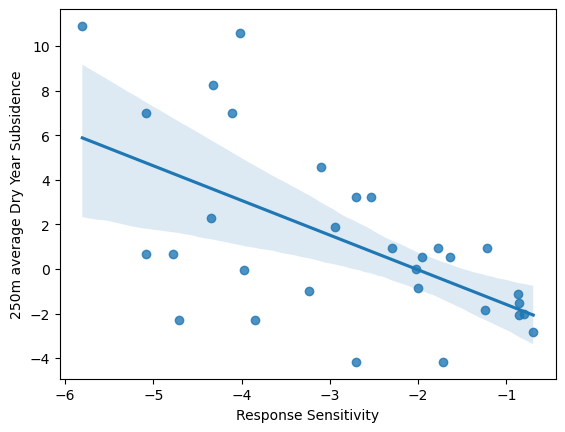

In [46]:
simple_5021['250m_avg_Dry_Year_Average'] = pd.to_numeric(simple_5021['250m_avg_Dry_Year_Average'], errors='coerce')
sns.regplot(data=simple_5021[simple_5021.p_slope < 0.01]
            , x="gradient", y="250m_avg_Dry_Year_Average")
print(f"Gradient against Dry_SAR for p_slope < 0.01")
plt.xlabel("Response Sensitivity")
plt.ylabel("250m average Dry Year Subsidence")
plt.show()

In [47]:
simple_5021['250m_D_mean'] = pd.to_numeric(simple_5021['250m_D_mean'], errors='coerce')
simple_5021['250m_D_sd'] = pd.to_numeric(simple_5021['250m_D_sd'], errors='coerce')
simple_std = simple_5021.copy()
simple_std["gradient_z"] = (simple_std.gradient - simple_std.gradient.mean()) / simple_std.gradient.std()
simple_std["SAR_zC"] = ((simple_std["250m_avg_Dry_Year_Average"] - sar_gdf["Dry_Year_Avg"].mean()) 
                       / sar_gdf["Dry_Year_Avg"].std())
simple_std["SAR_zR"] = (simple_std["250m_avg_Dry_Year_Average"] - simple_std["250m_D_mean"]) / simple_std["250m_D_sd"]
simple_std["SAR_zZ"] = (simple_std.SAR_zR - simple_std.SAR_zR.mean()) / simple_std.SAR_zR.std()

In [48]:
simple_std

,site_code,latitude,longitude,well_depth,gradient,p_slope,250m_avg_Dry_Year_Average,250m_D_mean,250m_D_sd,gradient_z,SAR_zC,SAR_zR,SAR_zZ
0,390174N1214630W001,39.01744,-121.46299,71.0,-0.230286,0.680094,1.340000,-2.547440,6.292940,1.044297,-0.044523,0.617746,-0.530619
1,389116N1215238W002,38.91160,-121.52380,710.0,-2.603518,0.035158,0.660885,-1.737640,11.250037,-0.418419,-0.096580,0.213202,-1.089153
2,390084N1214989W001,39.00837,-121.49888,249.0,0.035132,0.154623,1.413750,-6.213704,7.671754,1.207884,-0.038870,0.994226,-0.010833
3,388965N1219139W003,38.89650,-121.91390,300.0,-2.087968,0.122913,NaN,NaN,NaN,-0.100666,NaN,NaN,NaN
4,388260N1215394W001,38.82388,-121.54310,890.0,-2.028019,0.006269,-0.008333,-7.552729,10.191407,-0.063716,-0.147878,0.740270,-0.361456
...,...,...,...,...,...,...,...,...,...,...,...,...,...
163,396528N1218526W001,39.65280,-121.85260,517.0,-2.560523,0.063193,1.006667,-8.057585,8.262671,-0.391920,-0.070075,1.097012,0.131079
164,396468N1217263W001,39.64680,-121.72630,660.0,-1.746504,0.011262,-4.172250,-5.577075,8.651508,0.109792,-0.467058,0.162379,-1.159321
165,396087N1220456W002,39.60870,-122.04560,160.0,-0.770547,0.208182,2.257833,-8.243372,12.519958,0.711313,0.025832,0.838757,-0.225480
166,396158N1218221W001,39.61576,-121.82216,201.0,-4.350610,0.002384,2.302500,-4.770873,8.191033,-1.495221,0.029256,0.863551,-0.191249


Gradient against Dry_SAR (z-score) for p_slope < 0.01


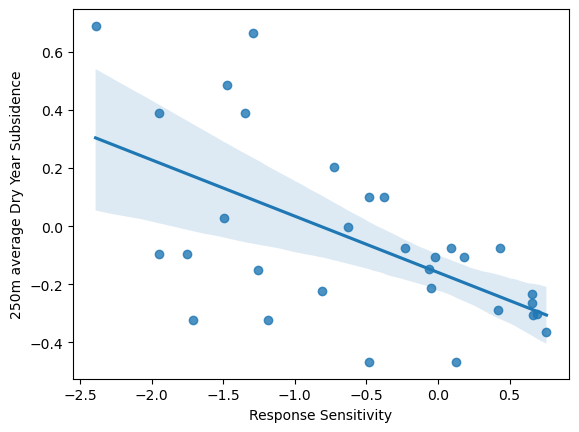

In [53]:
sns.regplot(data=simple_std[simple_std.p_slope < 0.01]
            , x="gradient_z", y="SAR_zC")
print(f"Gradient against Dry_SAR (z-score) for p_slope < 0.01")
plt.xlabel("Response Sensitivity")
plt.ylabel("250m average Dry Year Subsidence")
plt.show()

In [50]:
linregress(simple_std[simple_std.p_slope < 0.01]['gradient_z'], simple_std[simple_std.p_slope < 0.01]['SAR_zC'])

LinregressResult(slope=-0.1935386168961391, intercept=-0.15924903084191963, rvalue=-0.5892154639104583, pvalue=0.000487433922315902, stderr=0.049282522867624357, intercept_stderr=0.0525138304784509)

In [51]:
linregress(simple_std.dropna()['gradient_z'], simple_std.dropna()['SAR_zR'])

LinregressResult(slope=-0.2609691120455503, intercept=0.9945722488558255, rvalue=-0.36795905003554913, pvalue=3.10518011884137e-06, stderr=0.05384596274967641, intercept_stderr=0.05483020083908539)

Gradient against Dry_SAR (z-score) for p_slope < 0.05


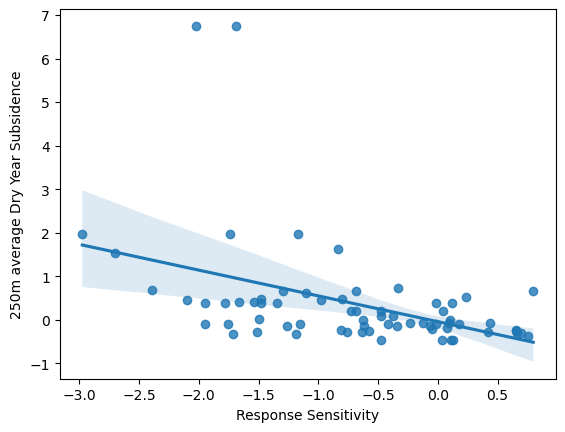

In [52]:
sns.regplot(data=simple_std[simple_std.p_slope < 0.05]
            , x="gradient_z", y="SAR_zC")
print(f"Gradient against Dry_SAR (z-score) for p_slope < 0.05")
plt.xlabel("Response Sensitivity")
plt.ylabel("250m average Dry Year Subsidence")
plt.show()

Gradient against Dry_SAR (z-score)


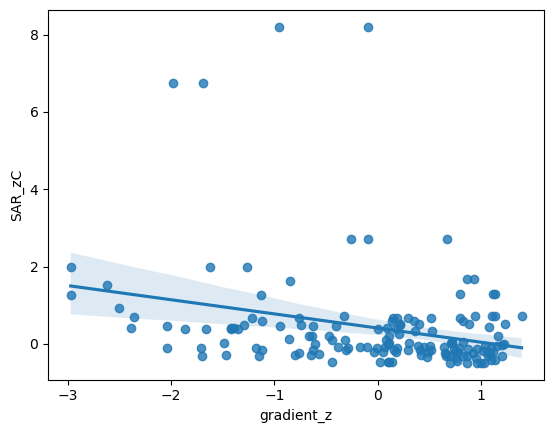

In [47]:
sns.regplot(data=simple_std
            , x="gradient_z", y="SAR_zC")
print(f"Gradient against Dry_SAR (z-score)")
plt.show()

In [36]:
linregress(x=simple_5021[simple_5021.p_slope < 0.01].dropna().gradient, y=simple_5021[simple_5021.p_slope < 0.01].dropna()["250m_avg_Dry_Year_Average"])

LinregressResult(slope=-1.6031043993240945, intercept=-3.2411390421847655, rvalue=-0.5940481535961896, pvalue=0.0004260747454918732, stderr=0.40311516410605086, intercept_stderr=1.2666808137312904)

In [37]:
len(simple_5021[simple_5021.p_slope < 0.01].dropna())

31

In [38]:
temp = simple_5021[simple_5021.p_slope < 0.05].dropna()
len(temp)

68

In [39]:
linregress(x=temp.gradient, y=temp["250m_avg_Dry_Year_Average"])

LinregressResult(slope=-4.327460308292181, intercept=-6.793231388777, rvalue=-0.39011540846503107, pvalue=0.0010065823195839804, stderr=1.2572373674527644, intercept_stderr=4.284100750053478)

Gradient against Dry_SAR for p_slope < 0.05


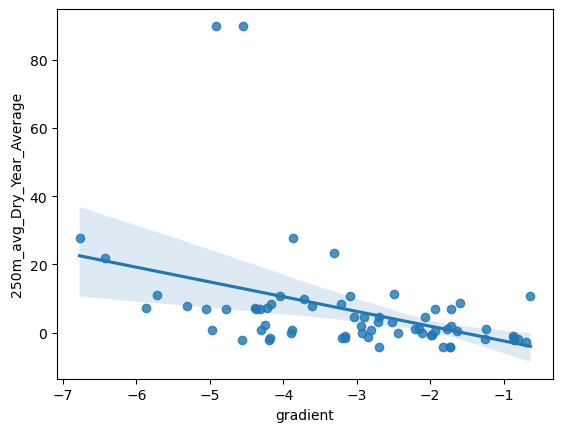

In [40]:
sns.regplot(data=temp, x=temp.gradient, y=temp["250m_avg_Dry_Year_Average"])
print(f"Gradient against Dry_SAR for p_slope < 0.05")
plt.show()

In [41]:
sig_df = simple_5021[simple_5021.p_slope < 0.05].dropna()
high_sig_df = simple_5021[simple_5021.p_slope < 0.01].dropna()

In [42]:
regular = linregress(y=simple_5021.dropna().gradient, x=simple_5021.dropna()["250m_avg_Dry_Year_Average"])
sig = linregress(y=sig_df.gradient, x=sig_df["250m_avg_Dry_Year_Average"])
high_sig = linregress(y=high_sig_df.gradient, x=high_sig_df["250m_avg_Dry_Year_Average"])

In [43]:
slopes  = np.array([regular.slope,  sig.slope,  high_sig.slope])
stderrs = np.array([regular.stderr, sig.stderr, high_sig.stderr])

In [44]:
weights = 1.0 / (stderrs ** 2)
combined_slope = np.sum(slopes * weights) / np.sum(weights)
combined_stderr = np.sqrt(1.0 / np.sum(weights))

In [45]:
combined_slope

-0.031885507866103203

In [46]:
abs(combined_slope) / combined_stderr

5.312974256599862

In [47]:
slope_interval = [combined_slope - 2 * combined_stderr, combined_slope + 2 * combined_stderr]
slope_interval

[-0.04388839224917527, -0.019882623483031138]

In [48]:
results = [regular, sig, high_sig]

In [49]:
intercepts = np.array([res.intercept for res in results])
intercepts_se = np.array([res.intercept_stderr for res in results])

weights_intercept = 1.0 / (intercepts_se ** 2)
combined_intercept = np.sum(weights_intercept * intercepts) / np.sum(weights_intercept)

combined_intercept_se = np.sqrt(1.0 / np.sum(weights_intercept))

In [50]:
combined_intercept

-2.264398082704085

In [51]:
combined_intercept_se

0.09926405753626869

#### Looking at setting up the model for 2021 as proof of concept before trying over more dry years.

In [52]:
simple_5021

,site_code,latitude,longitude,well_depth,gradient,p_slope,250m_avg_Dry_Year_Average
0,388813N1217525W003,38.86903,-121.75250,573.0,-0.082527,0.419116,18.867778
1,386464N1216675W004,38.64640,-121.66750,545.0,-1.607192,0.103296,10.572708
2,388260N1215394W004,38.82388,-121.54310,120.0,-1.097408,0.063646,-0.008333
3,388593N1214885W001,38.85930,-121.48850,700.0,-3.205201,0.018684,-1.676042
4,388593N1214885W002,38.85930,-121.48850,500.0,-3.159497,0.015717,-1.676042
...,...,...,...,...,...,...,...
164,390174N1214630W003,39.01744,-121.46299,450.0,-0.052759,0.732706,1.340000
165,390214N1214057W001,39.02142,-121.40566,175.0,-0.080143,0.798428,-3.514167
166,390174N1214630W001,39.01744,-121.46299,71.0,-0.230286,0.680094,1.340000
167,390461N1214606W001,39.04606,-121.46065,285.0,-0.185076,0.744195,-2.026615


In [53]:
simple_5021["grad_pred"] = simple_5021["250m_avg_Dry_Year_Average"] * combined_slope + combined_intercept
simple_5021["grad_pred_low"] = simple_5021["250m_avg_Dry_Year_Average"] * slope_interval[0] + combined_intercept
simple_5021["grad_pred_high"] = simple_5021["250m_avg_Dry_Year_Average"] * slope_interval[1] + combined_intercept

In [54]:
np.mean(abs(simple_5021.gradient - simple_5021.grad_pred))

1.4379950864243916

In [162]:
simple_5021_gdf = gpd.GeoDataFrame(
    simple_5021,
    geometry=gpd.points_from_xy(simple_5021.longitude, simple_5021.latitude),
    crs="EPSG:4326"
)

In [51]:
temp[temp["250m_avg_Dry_Year_Average"] > 40]

,site_code,latitude,longitude,well_depth,gradient,p_slope,250m_avg_Dry_Year_Average
12,396244N1221872W001,39.6244,-122.1872,1020.0,-4.514329,0.010541,89.973333
30,396244N1221872W002,39.6244,-122.1872,720.0,-5.111193,0.015519,89.973333


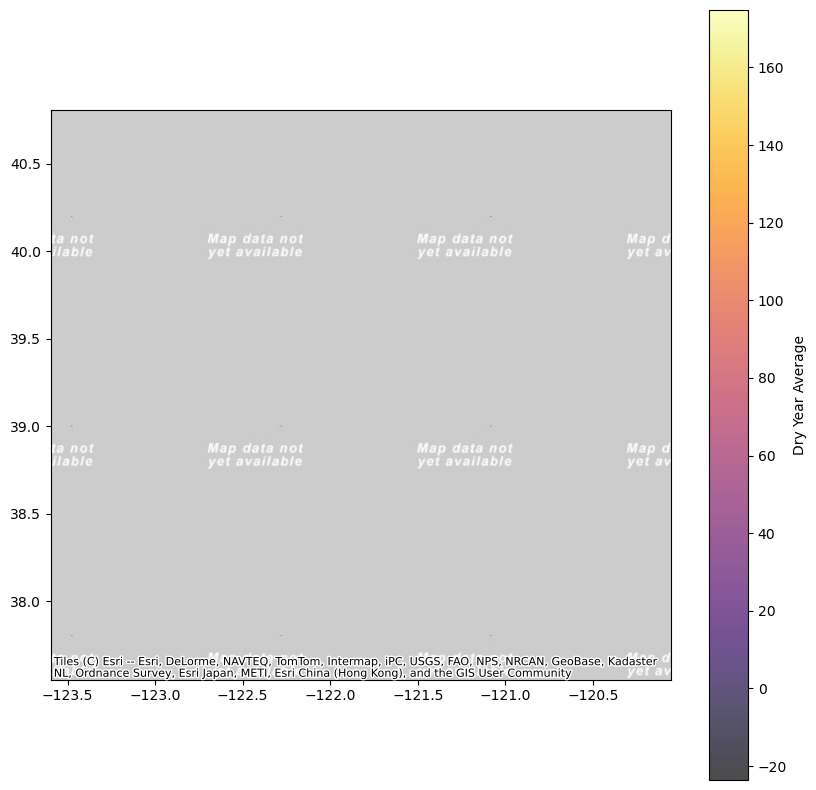

In [67]:
fig, ax = plt.subplots(figsize=(10, 10))

xmin, ymin, xmax, ymax = basin_ll.total_bounds
x_buffer = (xmax - xmin) * 0.7
y_buffer = (ymax - ymin) * 0.2
ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
ax.set_ylim(ymin - y_buffer, ymax + y_buffer)

larger_polygon_3857.plot(
    ax=ax, 
    color='lightgray', 
    edgecolor='black', 
    alpha=0.5
)

contour = ax.contourf(
    xx_3857, 
    yy_3857, 
    z_interp_masked,
    levels=500,
    cmap='inferno', 
    alpha=0.7
)

cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Dry Year Average')

#ax.legend()
#ax.set_aspect('equal')

ctx.add_basemap(
    ax, 
    crs=larger_polygon_3857.crs,
    source=ctx.providers.Esri.WorldTopoMap
)

plt.show()

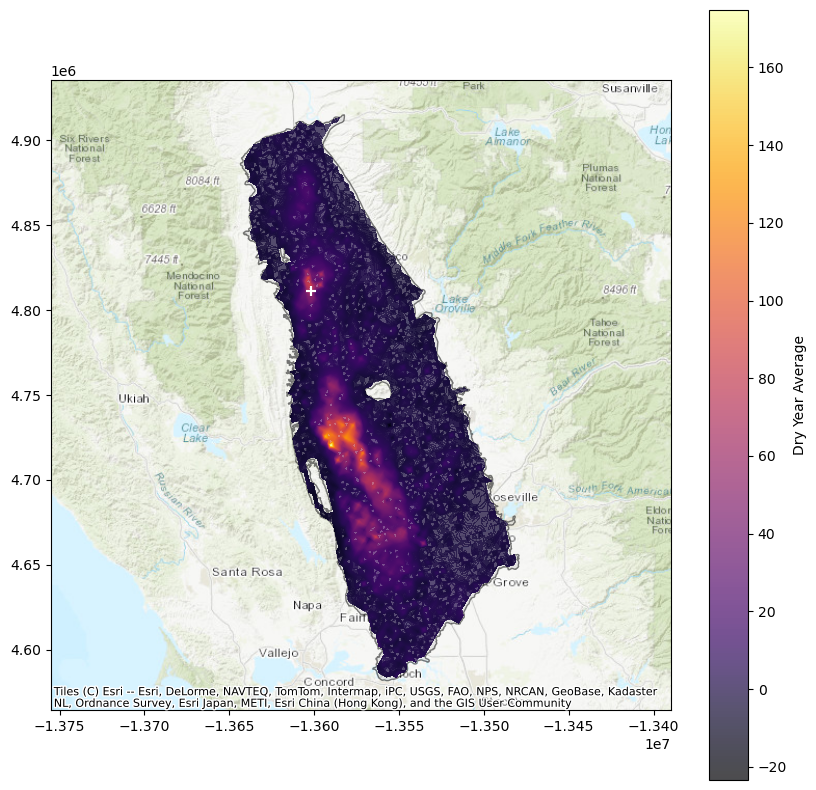

In [53]:
wells_df = temp[temp["250m_avg_Dry_Year_Average"] > 40].copy()
wells_df['geometry'] = wells_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

# Convert to a GeoDataFrame, assuming the original coordinates are in EPSG:4326
wells_gdf = gpd.GeoDataFrame(wells_df, geometry='geometry', crs="EPSG:4326")

# Reproject wells to match the CRS of your larger_polygon_3857 (likely EPSG:3857)
wells_gdf = wells_gdf.to_crs(larger_polygon_3857.crs)

# Create your plot as before
fig, ax = plt.subplots(figsize=(10, 10))

larger_polygon_3857.plot(
    ax=ax, 
    color='lightgray', 
    edgecolor='black', 
    alpha=0.5
)

contour = ax.contourf(
    xx_3857, 
    yy_3857, 
    z_interp_masked, 
    levels=1000, 
    cmap='inferno', 
    alpha=0.7
)

cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Dry Year Average')

# Plot the wells as blue dots; adjust markersize as needed
wells_gdf.plot(
    ax=ax, 
    marker='+', 
    color='white', 
    markersize=50, 
    label='Wells'
)

ax.set_aspect('equal')

ctx.add_basemap(
    ax, 
    crs=larger_polygon_3857.crs,
    source=ctx.providers.Esri.WorldTopoMap
)

plt.show()

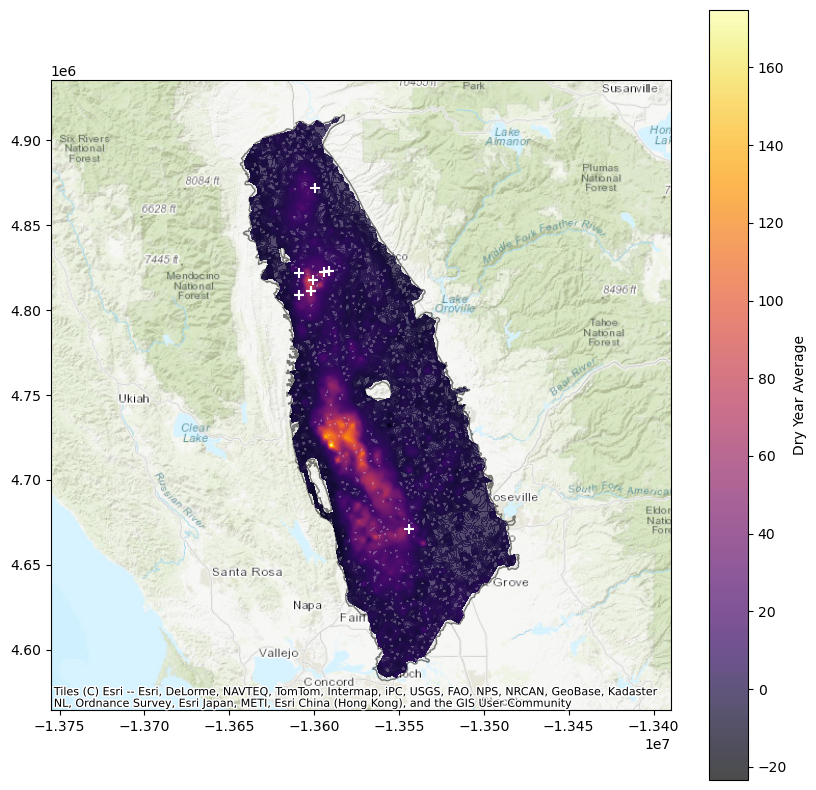

In [54]:
wells_df = temp[temp["250m_avg_Dry_Year_Average"] > 10].copy()

# Create a geometry column using longitude and latitude
wells_df['geometry'] = wells_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

# Convert to a GeoDataFrame, assuming the original coordinates are in EPSG:4326
wells_gdf = gpd.GeoDataFrame(wells_df, geometry='geometry', crs="EPSG:4326")

# Reproject wells to match the CRS of your larger_polygon_3857 (likely EPSG:3857)
wells_gdf = wells_gdf.to_crs(larger_polygon_3857.crs)

# Create your plot as before
fig, ax = plt.subplots(figsize=(10, 10))

larger_polygon_3857.plot(
    ax=ax, 
    color='lightgray', 
    edgecolor='black', 
    alpha=0.5
)

contour = ax.contourf(
    xx_3857, 
    yy_3857, 
    z_interp_masked, 
    levels=1000, 
    cmap='inferno', 
    alpha=0.7
)

cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Dry Year Average')

# Plot the wells as blue dots; adjust markersize as needed
wells_gdf.plot(
    ax=ax, 
    marker='+', 
    color='white', 
    markersize=50, 
    label='Wells'
)

ax.set_aspect('equal')

ctx.add_basemap(
    ax, 
    crs=larger_polygon_3857.crs,
    source=ctx.providers.Esri.WorldTopoMap
)

plt.show()

/tmp/ipykernel_1782063/2863159934.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wells_df['geometry'] = wells_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)


well locations for p_slope < 0.05


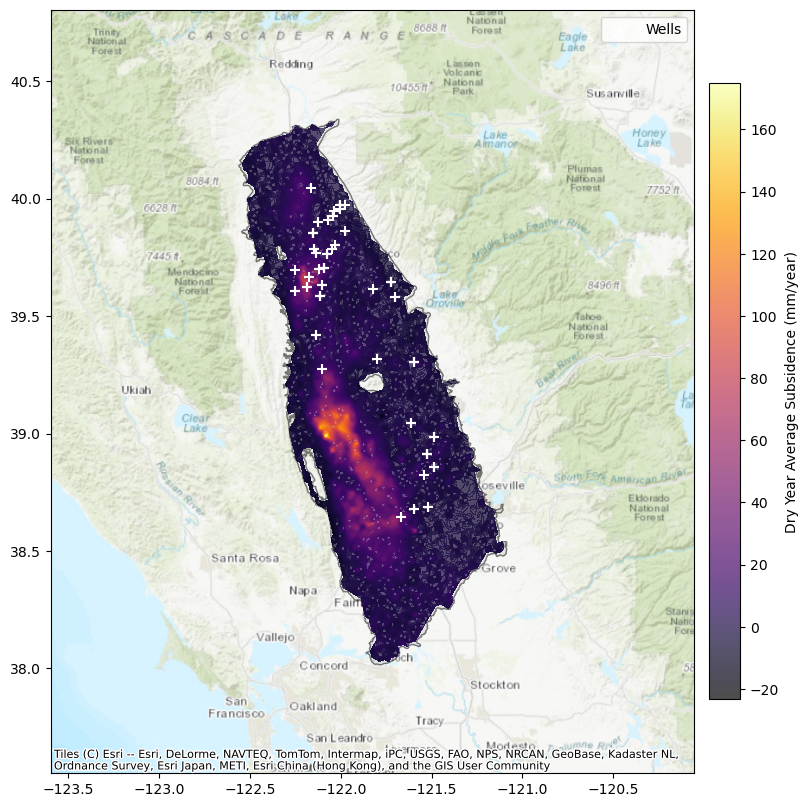

In [71]:
wells_df = simple_5021[simple_5021.p_slope < 0.05]
wells_df['geometry'] = wells_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
wells_gdf = gpd.GeoDataFrame(wells_df, geometry='geometry', crs="EPSG:4326")
fig, ax = plt.subplots(figsize=(10, 10))

xmin, ymin, xmax, ymax = basin_ll.total_bounds
x_buffer = (xmax - xmin) * 0.7
y_buffer = (ymax - ymin) * 0.2
ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
ax.set_ylim(ymin - y_buffer, ymax + y_buffer)

basin_ll.plot(
    ax=ax, 
    color='lightgray', 
    edgecolor='black', 
    alpha=0.5
)

contour = ax.contourf(
    lon_grid,
    lat_grid,
    z_interp_masked,
    levels=1000,
    cmap='inferno',
    alpha=0.7
)

cbar = plt.colorbar(contour, ax=ax,
    shrink=0.8,
    pad=0.02,
    aspect=20)
cbar.set_label('Dry Year Average Subsidence (mm/year)')

# Plot the wells as blue dots; adjust markersize as needed
wells_gdf.plot(
    ax=ax, 
    marker='+', 
    color='white', 
    markersize=50, 
    label='Wells'
)

ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldTopoMap,
    crs=wells_gdf.crs
)

print(f"well locations for p_slope < 0.05")
ax.legend()
plt.show()

In [56]:
def get_cdl_value(year, lon, lat):
    """
    Fetches and parses the CDL value for a given year, lon, and lat coordinates.

    Args:
        year (int): The year of the data.
        lon (float): The longitude.
        lat (float): The latitude.

    Returns:
        dict: A dictionary containing the result data.
              Returns None if the request fails or the Result element is not found.
    """
    # Construct the URL with the provided year, x, and y
    transformer = Transformer.from_crs("epsg:4326", "epsg:5070", always_xy=True)
    x, y = transformer.transform(lon, lat)
    url = f"https://nassgeodata.gmu.edu/axis2/services/CDLService/GetCDLValue?year={year}&x={x}&y={y}"

    # Send a GET request to the URL
    response = requests.get(url)

    # Check if the request was successful
    if response.status_code == 200:
        # Parse the XML content
        root = ET.fromstring(response.content)

        # Extract the Result element
        result_element = root.find(".//Result")  # No namespace needed

        if result_element is not None:
            # Get the text content of the Result element
            result_string = result_element.text

            # Fix the dictionary format by adding quotes around keys
            # Replace single quotes with double quotes for JSON compatibility
            result_string = result_string.replace("{", "{\"").replace(":", "\":").replace(", ", ", \"")

            # Convert the fixed string to a dictionary using json.loads
            result_dict = json.loads(result_string)

            return result_dict
        else:
            print("Result element not found in the XML response.")
            return None
    else:
        print(f"Failed to fetch data. Status code: {response.status_code}")
        return None

In [57]:
temp_category = simple_5021.apply(
    lambda row: get_cdl_value(2020, row.longitude, row.latitude).get('category'), axis=1)
temp_colour = simple_5021.apply(
    lambda row: get_cdl_value(2020, row.longitude, row.latitude).get('color'), axis=1)

In [58]:
simple_5021["planted"] = temp_category
simple_5021["planted_col"] = temp_colour

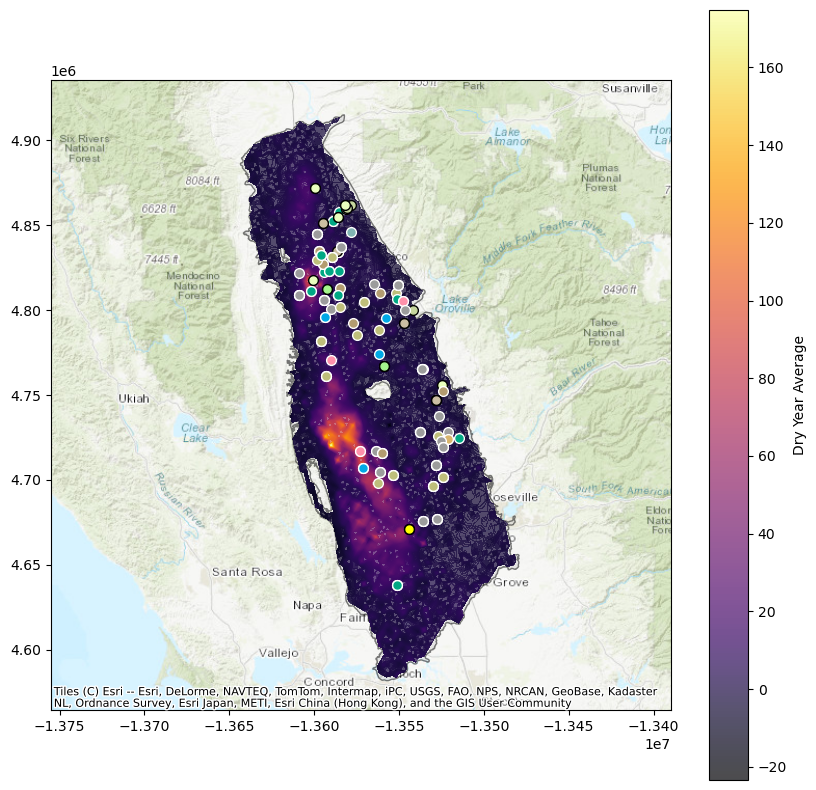

In [59]:
wells_df = simple_5021.copy()

# Create a geometry column using longitude and latitude
wells_df['geometry'] = wells_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

# Convert to a GeoDataFrame, assuming the original coordinates are in EPSG:4326
wells_gdf = gpd.GeoDataFrame(wells_df, geometry='geometry', crs="EPSG:4326")

# Reproject wells to match the CRS of your larger_polygon_3857 (likely EPSG:3857)
wells_gdf = wells_gdf.to_crs(larger_polygon_3857.crs)

fig, ax = plt.subplots(figsize=(10, 10))

# Plot your base polygon
larger_polygon_3857.plot(
    ax=ax, 
    color='lightgray', 
    edgecolor='black', 
    alpha=0.5
)

# Plot the contour layer
contour = ax.contourf(
    xx_3857, 
    yy_3857, 
    z_interp_masked, 
    levels=1000, 
    cmap='inferno', 
    alpha=0.7
)
cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Dry Year Average')

# Function to determine the appropriate outline color based on the hex brightness
def get_outline_color(hex_color):
    hex_color = hex_color.lstrip('#')
    r, g, b = int(hex_color[0:2], 16), int(hex_color[2:4], 16), int(hex_color[4:6], 16)
    brightness = 0.299 * r + 0.587 * g + 0.114 * b
    # Adjust the threshold as necessary
    return 'black' if brightness > 186 else 'white'

# Loop over each well to plot a plus marker with a colored interior and black/white outline
for idx, row in wells_gdf.iterrows():
    hex_color = row['planted_col']
    outline_color = get_outline_color(hex_color)
    
    # Plot the outline (larger marker)
    ax.plot(
        row.geometry.x,
        row.geometry.y,
        marker='o',
        markersize=7,  # larger size for the outline
        color=outline_color,
        linestyle='None'
    )
    # Plot the colored marker (smaller marker)
    ax.plot(
        row.geometry.x,
        row.geometry.y,
        marker='o',
        markersize=5,
        color=hex_color,
        linestyle='None'
    )

ax.set_aspect('equal')

ctx.add_basemap(
    ax, 
    crs=larger_polygon_3857.crs,
    source=ctx.providers.Esri.WorldTopoMap
)

plt.show()

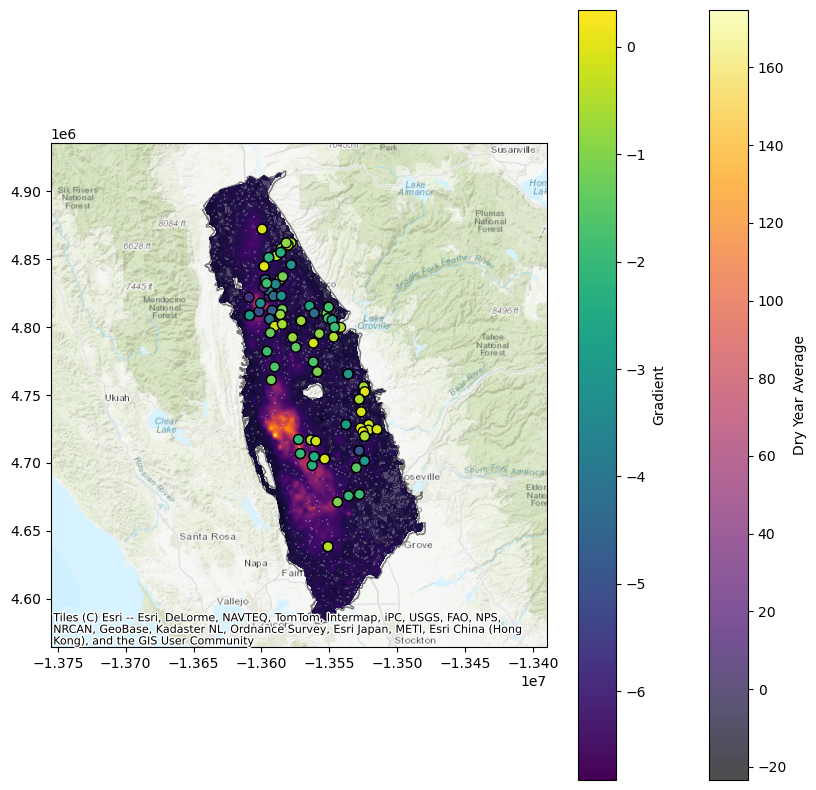

In [60]:
wells_df = simple_5021.copy()
wells_df['geometry'] = wells_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

# Convert to a GeoDataFrame (assuming EPSG:4326) and reproject to match the base polygon
wells_gdf = gpd.GeoDataFrame(wells_df, geometry='geometry', crs="EPSG:4326")
wells_gdf = wells_gdf.to_crs(larger_polygon_3857.crs)

fig, ax = plt.subplots(figsize=(10, 10))

# Plot the base polygon
larger_polygon_3857.plot(ax=ax, color='lightgray', edgecolor='black', alpha=0.5)

# Plot the contour layer
contour = ax.contourf(xx_3857, yy_3857, z_interp_masked, levels=1000, cmap='inferno', alpha=0.7)
cbar_contour = plt.colorbar(contour, ax=ax)
cbar_contour.set_label('Dry Year Average')

# Plot wells using a scatter plot colored by the "gradient" value.
# Adjust marker size (s) and edge color as desired.
sc = ax.scatter(
    wells_gdf.geometry.x,
    wells_gdf.geometry.y,
    c=wells_gdf['gradient'],
    cmap='viridis',   # Change colormap if needed
    s=50,             # Marker size
    edgecolor='black'
)

# Create a colorbar for the wells based on the gradient values
cbar_wells = plt.colorbar(sc, ax=ax)
cbar_wells.set_label('Gradient')

ax.set_aspect('equal')

# Add basemap
ctx.add_basemap(
    ax, 
    crs=larger_polygon_3857.crs,
    source=ctx.providers.Esri.WorldTopoMap
)

plt.show()

In [61]:
finder = simple_5021[((simple_5021["250m_avg_Dry_Year_Average"] > 20)
                      & (simple_5021.gradient > -6)
                     & (simple_5021.latitude < 39))]

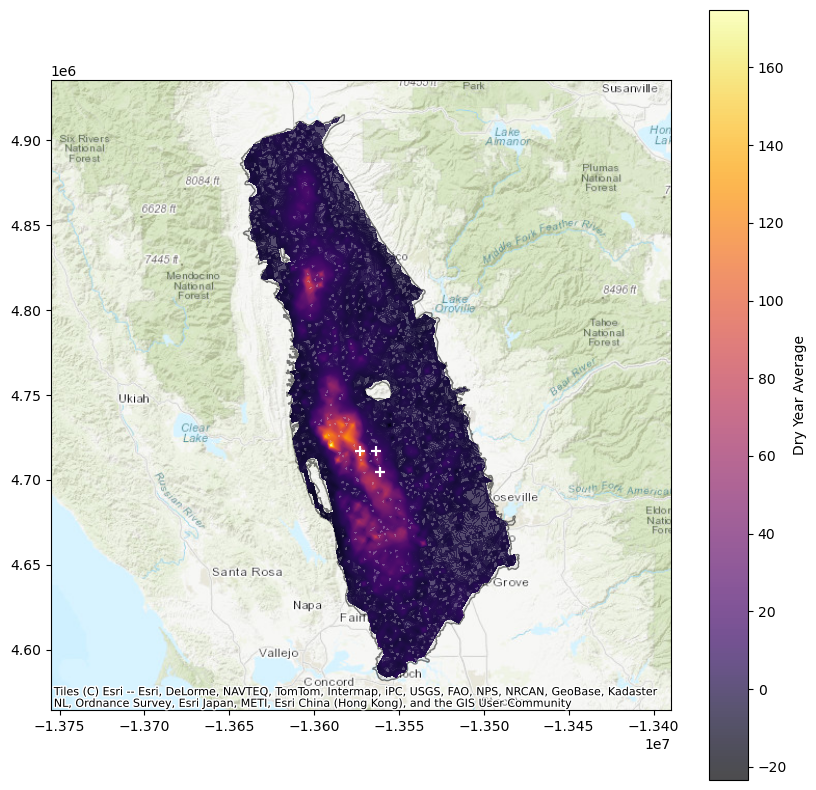

In [62]:
wells_df = finder.copy()

# Create a geometry column using longitude and latitude
wells_df['geometry'] = wells_df.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)

# Convert to a GeoDataFrame, assuming the original coordinates are in EPSG:4326
wells_gdf = gpd.GeoDataFrame(wells_df, geometry='geometry', crs="EPSG:4326")

# Reproject wells to match the CRS of your larger_polygon_3857 (likely EPSG:3857)
wells_gdf = wells_gdf.to_crs(larger_polygon_3857.crs)

# Create your plot as before
fig, ax = plt.subplots(figsize=(10, 10))

larger_polygon_3857.plot(
    ax=ax, 
    color='lightgray', 
    edgecolor='black', 
    alpha=0.5
)

contour = ax.contourf(
    xx_3857, 
    yy_3857, 
    z_interp_masked, 
    levels=1000, 
    cmap='inferno', 
    alpha=0.7
)

cbar = plt.colorbar(contour, ax=ax)
cbar.set_label('Dry Year Average')

# Plot the wells as blue dots; adjust markersize as needed
wells_gdf.plot(
    ax=ax, 
    marker='+', 
    color='white', 
    markersize=50, 
    label='Wells'
)

ax.set_aspect('equal')

ctx.add_basemap(
    ax, 
    crs=larger_polygon_3857.crs,
    source=ctx.providers.Esri.WorldTopoMap
)

plt.show()

In [63]:
finder

,site_code,latitude,longitude,well_depth,gradient,p_slope,250m_avg_Dry_Year_Average,planted,planted_col
112,389694N1219259W002,38.96940,-121.92590,480.0,-3.596639,0.070400,108.917500,Plums,#FF91AB
120,388813N1218219W002,38.88130,-121.82190,250.0,-0.859515,0.153626,37.221786,Developed/Low Intensity,#9C9C9C
124,388813N1218219W001,38.88130,-121.82190,545.0,-2.001293,0.130579,37.221786,Developed/Low Intensity,#9C9C9C
129,388813N1218219W003,38.88130,-121.82190,380.0,-2.438003,0.083651,37.221786,Developed/Low Intensity,#9C9C9C
138,389669N1218440W002,38.96688,-121.84391,525.0,-0.435412,0.567654,23.748000,Developed/Medium Intensity,#9C9C9C
140,389669N1218440W001,38.96688,-121.84391,709.0,-0.474693,0.640520,23.748000,Developed/Medium Intensity,#9C9C9C
141,389694N1219259W001,38.96940,-121.92590,885.0,-2.115618,0.099541,108.917500,Plums,#FF91AB


In [64]:
len(simple_5021)

169

In [66]:
a = simple_5021.copy()
a["Planted"] = ["Developed" if i.startswith("Developed") else i for i in a.planted]

/global/software/rocky-8.x86_64/manual/modules/langs/anaconda3/2024.02-1/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


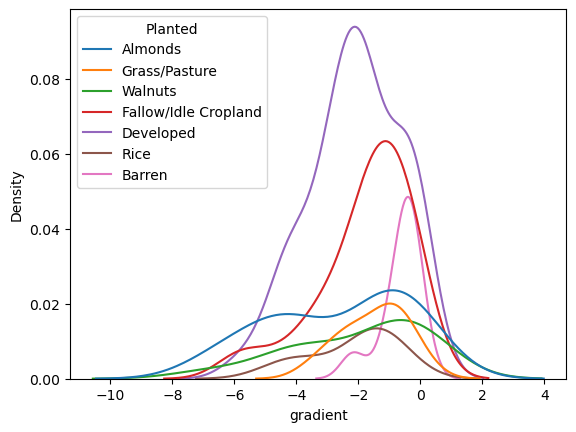

In [68]:
sns.kdeplot(data=a[a['Planted'].map(a['Planted'].value_counts()) >= 7], x='gradient', hue='Planted')
plt.show()

In [69]:
(a[a['Planted'].map(a['Planted'].value_counts()) >= 7]
 [["Planted", "gradient", "p_slope"]].groupby('Planted').mean())

,gradient,p_slope
Planted,,
Almonds,-2.657867,0.158788
Barren,-0.619834,0.278201
Developed,-2.094102,0.145763
Fallow/Idle Cropland,-1.787080,0.185886
Grass/Pasture,-1.493409,0.164427
Rice,-2.154645,0.097524
Walnuts,-2.041472,0.263492


In [3]:
sar_5021

,CODE,LAT,LON,HEIGHT,VEL_V,D20150101,D20150107,D20150113,D20150120,D20150126,...,D20240813,D20240820,D20240826,D20240901,D20240907,D20240913,D20240919,D20240925,D20241001,Basin_Subb
0,DX5IPRM,40.338973,-122.018572,320.85570,-1.6,NaN,NaN,NaN,NaN,NaN,...,-0.6,1.2,3.1,3.7,3.6,4.9,6.3,5.2,3.4,5-021.53
1,DX5IPRN,40.338973,-122.017438,673.82640,-0.6,NaN,NaN,NaN,NaN,NaN,...,-1.8,-1.5,-1.3,-1.2,-1.0,-0.3,-0.2,-0.2,-0.4,5-021.53
2,DX5IPRO,40.338973,-122.016305,10.95188,-0.3,NaN,NaN,NaN,NaN,NaN,...,1.2,1.2,1.5,2.0,2.1,2.5,2.5,2.6,2.0,5-021.53
3,DX5IPRP,40.338973,-122.015171,140.33210,-1.1,NaN,NaN,NaN,NaN,NaN,...,-0.0,0.3,1.0,1.8,2.1,2.8,3.0,2.9,2.1,5-021.53
4,DX5IPRQ,40.338973,-122.014037,25.95095,-0.1,NaN,NaN,NaN,NaN,NaN,...,3.3,3.7,4.5,5.3,5.3,5.6,5.6,5.4,4.5,5-021.53
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
707339,CQLMEFC,38.023736,-121.775985,632.48270,4.1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5-021.66
707340,CQLMEFD,38.023736,-121.774851,107.01210,-34.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5-021.66
707341,CQL0YTF,38.022836,-121.781653,1315.45400,0.4,0.0,-0.1,-0.1,-0.2,-0.2,...,12.4,13.2,14.0,14.9,14.7,14.3,13.7,13.0,11.7,5-021.66
707342,CQL0YTJ,38.022836,-121.777118,1361.62000,6.1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5-021.66


In [3]:
date_cols = sorted(
    [c for c in sar_5021.columns if c.startswith('D')],
    key=lambda c: pd.to_datetime(c[1:], format='%Y%m%d')
)

abs_vals = sar_5021[date_cols].cumsum(axis=1)
abs_vals.columns = pd.to_datetime([c[1:] for c in date_cols], format='%Y%m%d')

abs_df = pd.concat([sar_5021[['LAT','LON']].reset_index(drop=True),
                    abs_vals.reset_index(drop=True)], axis=1)

In [4]:
abs_df

,LAT,LON,2015-01-01 00:00:00,2015-01-07 00:00:00,2015-01-13 00:00:00,2015-01-20 00:00:00,2015-01-26 00:00:00,2015-02-01 00:00:00,2015-02-07 00:00:00,2015-02-12 00:00:00,...,2024-08-07 00:00:00,2024-08-13 00:00:00,2024-08-20 00:00:00,2024-08-26 00:00:00,2024-09-01 00:00:00,2024-09-07 00:00:00,2024-09-13 00:00:00,2024-09-19 00:00:00,2024-09-25 00:00:00,2024-10-01 00:00:00
0,40.338973,-122.018572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,134.5,133.9,135.1,138.2,141.9,145.5,150.4,156.7,161.9,165.3
1,40.338973,-122.017438,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-855.2,-857.0,-858.5,-859.8,-861.0,-862.0,-862.3,-862.5,-862.7,-863.1
2,40.338973,-122.016305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,813.5,814.7,815.9,817.4,819.4,821.5,824.0,826.5,829.1,831.1
3,40.338973,-122.015171,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,800.1,800.1,800.4,801.4,803.2,805.3,808.1,811.1,814.0,816.1
4,40.338973,-122.014037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,430.8,434.1,437.8,442.3,447.6,452.9,458.5,464.1,469.5,474.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
707339,38.023736,-121.775985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
707340,38.023736,-121.774851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
707341,38.022836,-121.781653,0.0,-0.1,-0.2,-0.4,-0.6,-0.9,-1.3,-1.7,...,-872.1,-859.7,-846.5,-832.5,-817.6,-802.9,-788.6,-774.9,-761.9,-750.2
707342,38.022836,-121.777118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


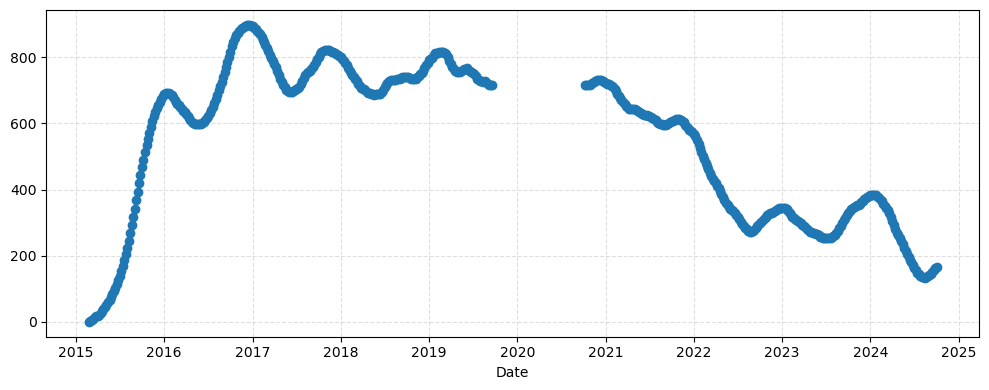

In [5]:
date_cols = [c for c in abs_df.columns if isinstance(c, pd.Timestamp)]
i = 0
y = abs_df.loc[i, date_cols]
x = date_cols

# 4. plot
plt.figure(figsize=(10,4))
plt.plot(x, y, marker='o', linestyle='-')
plt.xlabel('Date')
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

In [8]:
def seasonality(row, period=61):
    date_cols = [c for c in row.index if isinstance(c, pd.Timestamp)]
    ts = pd.Series(
        data=row.loc[date_cols].values,
        index=pd.DatetimeIndex(date_cols)
    ).sort_index().dropna()
    if len(ts) < 2 * period:
        return np.nan
    result = seasonal_decompose(ts, model="additive", period=period, extrapolate_trend="freq")
    seasonal = result.seasonal.dropna()
    amplitude = seasonal.max() - seasonal.min() 
    return amplitude

In [ ]:
n_rows = len(abs_df)
chunk_size = 100
amplitudes = []

with tqdm(total=n_rows, desc="Computing seasonal amplitude") as pbar:
    for start in range(0, n_rows, chunk_size):
        chunk = abs_df.iloc[start : start + chunk_size]
        chunk_amps = Parallel(n_jobs=-1)(
            delayed(seasonality)(row, 61) 
            for _, row in chunk.iterrows()
        )
        amplitudes.extend(chunk_amps)
        pbar.update(len(chunk))

abs_df["seasonal_amplitude"] = amplitudes

In [11]:
abs_df

,LAT,LON,2015-01-01 00:00:00,2015-01-07 00:00:00,2015-01-13 00:00:00,2015-01-20 00:00:00,2015-01-26 00:00:00,2015-02-01 00:00:00,2015-02-07 00:00:00,2015-02-12 00:00:00,...,2024-08-07 00:00:00,2024-08-13 00:00:00,2024-08-20 00:00:00,2024-08-26 00:00:00,2024-09-01 00:00:00,2024-09-07 00:00:00,2024-09-13 00:00:00,2024-09-19 00:00:00,2024-09-25 00:00:00,2024-10-01 00:00:00
0,40.338973,-122.018572,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,134.5,133.9,135.1,138.2,141.9,145.5,150.4,156.7,161.9,165.3
1,40.338973,-122.017438,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-855.2,-857.0,-858.5,-859.8,-861.0,-862.0,-862.3,-862.5,-862.7,-863.1
2,40.338973,-122.016305,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,813.5,814.7,815.9,817.4,819.4,821.5,824.0,826.5,829.1,831.1
3,40.338973,-122.015171,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,800.1,800.1,800.4,801.4,803.2,805.3,808.1,811.1,814.0,816.1
4,40.338973,-122.014037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,430.8,434.1,437.8,442.3,447.6,452.9,458.5,464.1,469.5,474.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
707339,38.023736,-121.775985,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
707340,38.023736,-121.774851,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
707341,38.022836,-121.781653,0.0,-0.1,-0.2,-0.4,-0.6,-0.9,-1.3,-1.7,...,-872.1,-859.7,-846.5,-832.5,-817.6,-802.9,-788.6,-774.9,-761.9,-750.2
707342,38.022836,-121.777118,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [2]:
seasonal = pd.read_csv("seasonal_SAR.csv")
seasonal = seasonal.drop(columns=["Unnamed: 0"])

In [3]:
seasonal = gpd.GeoDataFrame(
    seasonal,
    geometry=gpd.points_from_xy(seasonal['LON'], seasonal['LAT']),
    crs='EPSG:4326'
)

In [6]:
filtered_gdf = gdf[gdf['Basin_Numb'] == '5-021']

In [7]:
wgs84_5021 = filtered_gdf.to_crs(epsg=4326)

<Axes: >

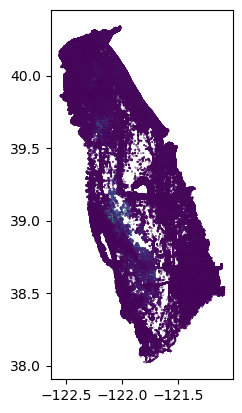

In [8]:
seasonal.plot("seasonal_amplitude", markersize=0.05)

In [19]:
seasonal_proj = seasonal.to_crs(epsg=32610)
coords = np.vstack((seasonal_proj.geometry.x, seasonal_proj.geometry.y)).T
values = seasonal_proj['seasonal_amplitude'].values

known_mask   = ~np.isnan(values)
unknown_mask =  np.isnan(values)

known_coords = coords[known_mask]
known_vals   = values[known_mask]
unknown_coords = coords[unknown_mask]
tree = cKDTree(known_coords)

print("cKDTree built.")

k     = 6    # number of nearest neighbors
power = 2.0  # inverse distance power

def interpolate_chunk(chunk_coords):
    dists, idxs = tree.query(chunk_coords, k=k)
    dists[dists == 0] = 1e-10
    w = 1.0 / (dists**power)
    w /= w.sum(axis=1)[:, None]
    return np.sum(w * known_vals[idxs], axis=1)

n_jobs    = -1
n_chunks  = cpu_count()
chunks    = np.array_split(unknown_coords, n_chunks)

results = Parallel(n_jobs=n_jobs)(
    delayed(interpolate_chunk)(chunk)
    for chunk in tqdm(chunks, desc="IDW interpolation", unit="chunk")
)

interpolated = np.concatenate(results)
seasonal_proj.loc[unknown_mask, 'seasonal_amplitude'] = interpolated
seasonal_filled = seasonal_proj.to_crs(seasonal.crs)

cKDTree built.


IDW interpolation: 100%|██████████| 24/24 [00:00<00:00, 52.05chunk/s]


<Axes: >

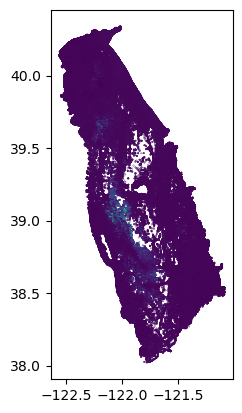

In [25]:
seasonal_filled.plot("seasonal_amplitude", markersize=0.05)

In [27]:
grid = gpd.read_file("grid.gpkg")[["longitude", "latitude", "geometry"]]

In [30]:
grid = grid.to_crs(seasonal_filled.crs)
points = seasonal_filled[['seasonal_amplitude', 'geometry']]
joined = gpd.sjoin(points, grid, how='inner', predicate='within')
agg = joined.groupby('index_right').seasonal_amplitude.agg(['mean', 'count'])
grid = grid.join(agg, how='left')
grid = grid.rename(columns={
    'mean':  'mean_seasonal_amplitude',
    'count': 'n_points'
})

In [36]:
grid_pts = grid.copy()
grid_pts['geometry'] = gpd.points_from_xy(grid_pts.longitude, grid_pts.latitude)
grid_pts = gpd.GeoDataFrame(grid_pts, geometry='geometry', crs='EPSG:4326')

grid_proj = grid_pts.to_crs(epsg=32610)
coords = np.vstack((grid_proj.geometry.x, grid_proj.geometry.y)).T
values = grid_proj['mean_seasonal_amplitude'].values

known_mask   = ~np.isnan(values)
unknown_mask =  np.isnan(values)

known_coords = coords[known_mask]
known_vals   = values[known_mask]
unknown_coords = coords[unknown_mask]

tree = cKDTree(known_coords)

k     = 6
power = 2.0

dists, idxs = tree.query(unknown_coords, k=k)
dists[dists == 0] = 1e-10

weights = 1.0 / (dists**power)
weights /= weights.sum(axis=1)[:, None]
interpolated = np.sum(weights * known_vals[idxs], axis=1)

grid_proj.loc[unknown_mask, 'mean_seasonal_amplitude'] = interpolated
grid_filled = grid_proj.to_crs(grid.crs)

In [38]:
grid_boxes = grid.copy()
grid_boxes['mean_seasonal_amplitude'] = grid_filled['mean_seasonal_amplitude']

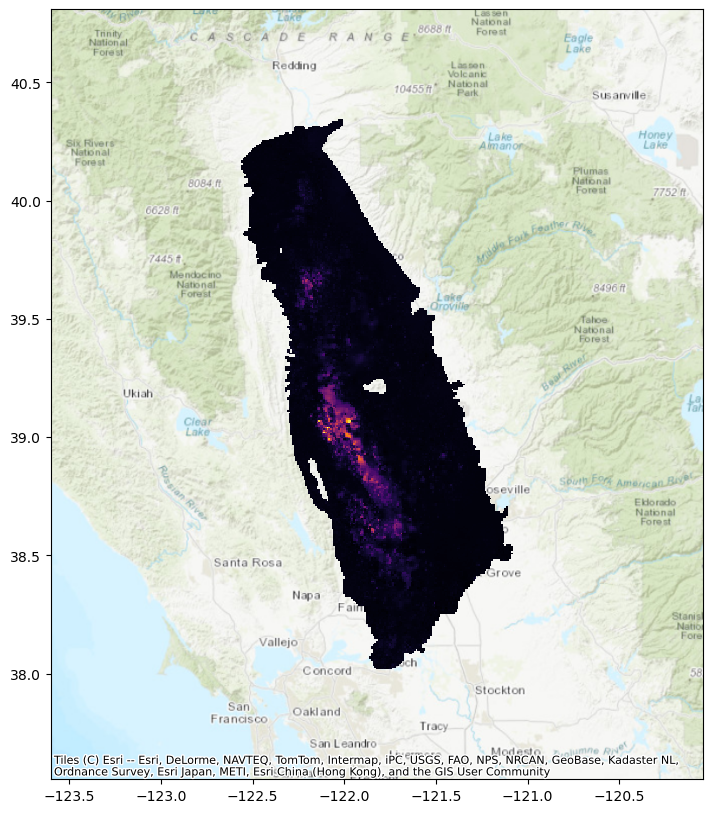

In [43]:
fig, ax = plt.subplots(figsize=(10, 10))
xmin, ymin, xmax, ymax = grid_boxes.total_bounds
x_buffer = (xmax - xmin) * 0.7
y_buffer = (ymax - ymin) * 0.2
ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
ax.set_ylim(ymin - y_buffer, ymax + y_buffer)
grid_boxes.plot(
    column='mean_seasonal_amplitude',
    ax=ax,
    legend=False,
    cmap="inferno"
)
ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldTopoMap,
    crs=grid_boxes.crs
)
plt.show()

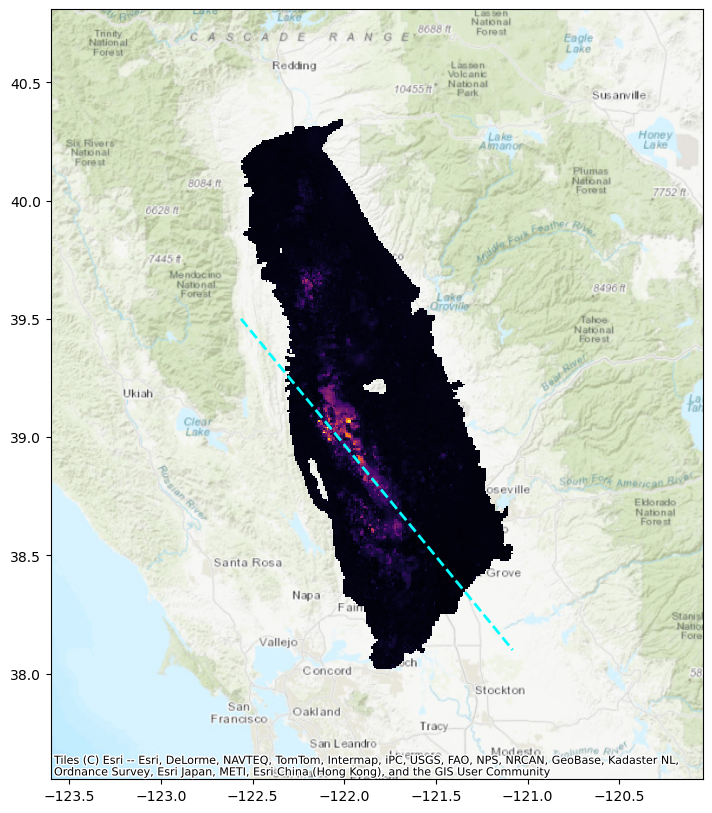

In [48]:
fig, ax = plt.subplots(figsize=(10, 10))
xmin, ymin, xmax, ymax = grid_boxes.total_bounds
x_buffer = (xmax - xmin) * 0.7
y_buffer = (ymax - ymin) * 0.2
ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
ax.set_ylim(ymin - y_buffer, ymax + y_buffer)
grid_boxes.plot(
    column='mean_seasonal_amplitude',
    ax=ax,
    legend=False,
    cmap="inferno"
)
ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldTopoMap,
    crs=grid_boxes.crs
)
ax.plot(
    [xmin, xmax],
    [39.5,  38.1],
    color="#00FFFF",
    linewidth=2,
    linestyle="--",
    transform=ax.transData
)
plt.show()

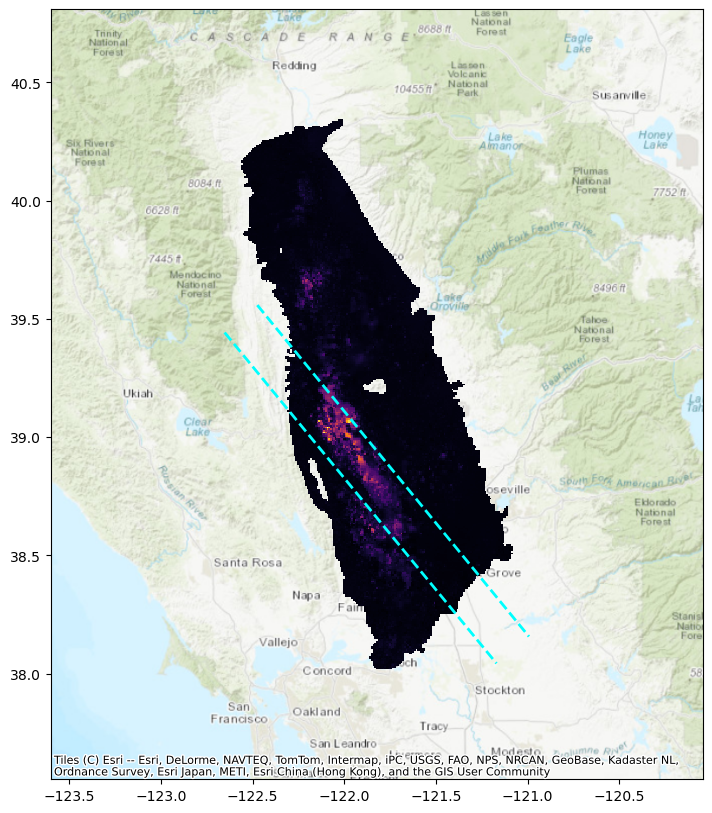

In [52]:
xmin, ymin, xmax, ymax = grid_boxes.total_bounds
orig_line = LineString([(xmin, 39.5), (xmax, 38.1)])
gdf_line  = gpd.GeoSeries([orig_line], crs=grid_boxes.crs)

metric_crs = "EPSG:3310"  
grid_metric = grid_boxes.to_crs(metric_crs)
line_metric = gdf_line.to_crs(metric_crs).iloc[0]

offset_left  = line_metric.parallel_offset(10000, "left")
offset_right = line_metric.parallel_offset(10000, "right")

off1_ll = gpd.GeoSeries([offset_left],  crs=metric_crs).to_crs(grid_boxes.crs).iloc[0]
off2_ll = gpd.GeoSeries([offset_right], crs=metric_crs).to_crs(grid_boxes.crs).iloc[0]

fig, ax = plt.subplots(figsize=(10, 10))

x_buffer = (xmax - xmin) * 0.7
y_buffer = (ymax - ymin) * 0.2
ax.set_xlim(xmin - x_buffer, xmax + x_buffer)
ax.set_ylim(ymin - y_buffer, ymax + y_buffer)

grid_boxes.plot(
    column='mean_seasonal_amplitude',
    ax=ax,
    legend=False,
    cmap="inferno"
)
ctx.add_basemap(
    ax,
    source=ctx.providers.Esri.WorldTopoMap,
    crs=grid_boxes.crs
)

ax.plot(*off1_ll.xy,
        color="#00FFFF", linewidth=2, linestyle="--",
        transform=ax.transData)
ax.plot(*off2_ll.xy,
        color="#00FFFF", linewidth=2, linestyle="--",
        transform=ax.transData)

plt.show()